# Tratamiento de imágenes - 2023 - Entregable 3

# Fecha de entrega: 04/6/2023


### Importante:

**En todos los ejercicios se espera que se presente un breve contexto teórico y se hagan comentarios sobre decisiones tomadas en la implementación así como un análisis de los resultados. Estos comentarios y análisis se pueden entregar en secciones agregadas al notebook o en un informe aparte agregado al notebook.**

**El notebook entregado debe tener guardados los resultados de su ejecución.**


In [24]:
import os
import numpy as np
from matplotlib import pyplot as plt
from skimage.io import imread, imsave
import skimage
import cv2
import seaborn as sns
import pandas as pd

# FORMAS DE VER LAS GRAFICAS --------------------
# ELEGIR UNA DE LAS OPCIONES Y DES-COMENTAR (sacar # de la linea)
# ----------------
# a) graficas en línea  entre las celdas (no interactivo)
%matplotlib inline
# ----------------
# b) graficas en línea  entre las celdas (interactivo)
# %matplotlib notebook
# ----------------
# c) graficas en ventanas externas (abre una ventana por cada figura)
# %matplotlib
# ----------------
# d) Si se usa "jupyter lab" en lugar de "jupyter notebook" usar %matplotlib widget en lugar de %matplotlib notebook
# requiere instalar el modulo "ipympl". Ver https://stackoverflow.com/questions/51922480/javascript-error-ipython-is-not-defined-in-jupyterlab#56416229
# %matplotlib widget
# ---------------------------------------------------

# Directorio con la base de imágenes de prueba (las que están en la web de Timag)
# Ej. si usan la imagen trapo.jpg en el notebook no tienen que subirla al eva
# La llaman en el notebook en forma relativa a donde tengan esas imagenes:
#
# filename = os.path.join(dir_base_imagenes, 'trapo.jpg')
# I = imread(filename)
dir_base_imagenes = (
    "./subsetOfKylbergTextureDataset-6classes-40samples"  # uncompress before use
)
dir_zip_imagenes = "./imagenes"  # uncompress before use

## 1. Clasificación de texturas

Se usará la base de datos
G. Kylberg. The Kylberg Texture Dataset v. 1.0, Centre for Image Analysis,
Swedish University of Agricultural Sciences and Uppsala University,
External report (Blue series) No. 35.  
Disponible en: http://www.cb.uu.se/~gustaf/texture/  
Bajar la versión reducida de la base (6 clases, 40 muestras por clase, ~50 MB)


### 1.1 Calcular descriptores de textura


#### Calcular descriptores sobre el histograma de niveles de gris


In [13]:
def calcular_descriptores_de_histograma(I):
    """
    Calcula el histograma normalizado de la imagen I.
    Devuelve descriptores sobre el histograma calculado

    Parameters
    ----------
    I : imagen de 256 niveles de gris (uint8)

    Returns
    -------
    mean : double
    R : double
    skewness : double
    flatness : double
    uniformity : double
    entropy : double

    """
    # calcular el histograma normalizado
    numBins = 256
    histograma, bin_edges = np.histogram(I[:], np.arange(numBins + 1), density=True)

    # Calcular los descriptores
    mean = np.mean(histograma)
    R = np.max(histograma) - np.min(histograma)
    skewness = np.sum((histograma - mean) ** 3) / len(histograma)
    flatness = np.sum((histograma - mean) ** 4) / len(histograma)
    uniformity = np.sum(histograma**2)
    entropy = -np.sum(histograma * np.log2(histograma + 1e-7))

    return mean, R, skewness, flatness, uniformity, entropy

#### Calcular descriptores sobre la matriz de coocurrencia

Para la implementación se usarán funciones adecuadas de  
https://scikit-image.org/docs/stable/api/skimage.feature.html


In [14]:
def calcular_descriptores_de_matriz_de_coocurrencia(
    I, distance, angle, levels=256, debug=False
):
    """
    Calcula la matriz de coocurrencia NORMALIZADA para la imagen I
    para la combinación (distancia, angulo) deseado
    Devuelve descriptores sobre la matriz de coocurrencia calculada
    Se implementa con funciones adecuadas de:
        skimage.feature

    Parameters
    ----------
    I : imagen de 256 niveles de gris (uint8)
    distance : int, optional
        Distancia entre pixeles para calcular la coocurrencia.
    angle : double, optional
        Angulo (en radianes con respecto a la horizontal) para calcular la coocurrencia.
    levels : int, optional . Por defecto 256.
        Usar solo para debuggear en imagenes artificiales pequeñas
    debug: bool, optional
        En caso de ser verdadero, imprime la matriz de coocurrencia
    Returns
    -------
    contrast : double
    dissimilarity : double
    homogeneity : double
    energy : double
    correlation : double

    """
    # Calcular la matriz de coocurrencia
    coocurrence_matrix = skimage.feature.graycomatrix(
        I, [distance], [angle], levels=levels, symmetric=True, normed=True
    )

    if debug:
        print("Matriz de coocurrencia:")
        print(coocurrence_matrix[:, :, 0, 0])

    # Calcular los descriptores
    contrast = skimage.feature.graycoprops(coocurrence_matrix, "contrast")[0, 0]
    dissimilarity = skimage.feature.graycoprops(coocurrence_matrix, "dissimilarity")[
        0, 0
    ]
    homogeneity = skimage.feature.graycoprops(coocurrence_matrix, "homogeneity")[0, 0]
    energy = skimage.feature.graycoprops(coocurrence_matrix, "energy")[0, 0]
    correlation = skimage.feature.graycoprops(coocurrence_matrix, "correlation")[0, 0]

    return contrast, dissimilarity, homogeneity, energy, correlation

#### Chequear cálculo de descriptores sobre la matriz de coocurrencia

Chequear que la matriz de coocurrencia y los descriptores estén bien calculados sobre un caso sencillo con 4 niveles


In [15]:
image = np.array(
    [[0, 0, 1, 1], [0, 0, 1, 1], [0, 2, 2, 2], [2, 2, 3, 3]], dtype=np.uint8
)


def printf(s, v):
    print(s, f"{v:4g}")


def print_descriptores_matriz_coocurrencia(
    contrast, dissimilarity, homogeneity, energy, correlation
):
    printf("Contrast:", contrast)
    printf("Dissimilarity:", dissimilarity)
    printf("Homogeneity:", homogeneity)
    printf("Energy:", energy)
    printf("Correlation:", correlation)


# chequear funcionamiento de la función para distancia 1 horizontal
(
    contrast,
    dissimilarity,
    homogeneity,
    energy,
    correlation,
) = calcular_descriptores_de_matriz_de_coocurrencia(
    image, distance=1, angle=0, levels=4, debug=True
)
print_descriptores_matriz_coocurrencia(
    contrast, dissimilarity, homogeneity, energy, correlation
)

print("\n")
# vertical
(
    contrast,
    dissimilarity,
    homogeneity,
    energy,
    correlation,
) = calcular_descriptores_de_matriz_de_coocurrencia(
    image, distance=1, angle=np.pi / 2, levels=4, debug=True
)
print_descriptores_matriz_coocurrencia(
    contrast, dissimilarity, homogeneity, energy, correlation
)

Matriz de coocurrencia:
[[0.16666667 0.08333333 0.04166667 0.        ]
 [0.08333333 0.16666667 0.         0.        ]
 [0.04166667 0.         0.25       0.04166667]
 [0.         0.         0.04166667 0.08333333]]
Contrast: 0.583333
Dissimilarity: 0.416667
Homogeneity: 0.808333
Energy: 0.381881
Correlation: 0.719533


Matriz de coocurrencia:
[[0.25       0.         0.08333333 0.        ]
 [0.         0.16666667 0.08333333 0.        ]
 [0.08333333 0.08333333 0.08333333 0.08333333]
 [0.         0.         0.08333333 0.        ]]
Contrast:    1
Dissimilarity: 0.666667
Homogeneity:  0.7
Energy: 0.372678
Correlation: 0.485714


#### Calcular descriptores de histograma y de matriz de coocurrencia sobre imágenes de la base de texturas. Mostrar ejemplos para imágenes de las distintas clases

Para la matriz de coocurrencia puede ser conveniente explorar distintas distancias y ángulos


In [16]:
def calcular_y_mostrar_descriptores(image):
    (
        hist_mean,
        hist_R,
        hist_skewness,
        hist_flatness,
        hist_uniformity,
        hist_entropy,
    ) = calcular_descriptores_de_histograma(image)

    distances = [1, 3, 5]
    angles = [0, np.pi / 4, np.pi / 2]  # 0, 45, 90 grados
    df_data = []
    for distance in distances:
        for angle in angles:
            descriptors = calcular_descriptores_de_matriz_de_coocurrencia(
                image, distance, angle
            )
            df_data.append([distance, np.rad2deg(angle)] + list(descriptors))
    df = pd.DataFrame(
        df_data,
        columns=[
            "Distance",
            "Angle",
            "Contrast",
            "Dissimilarity",
            "Homogeneity",
            "Energy",
            "Correlation",
        ],
    )

    print("Descriptores de histograma:")
    printf("Mean:", hist_mean)
    printf("R:", hist_R)
    printf("Skewness:", hist_skewness)
    printf("Flatness:", hist_flatness)
    printf("Uniformity:", hist_uniformity)
    printf("Entropy:", hist_entropy)

    print("\n")
    print("Descriptores de matriz de coocurrencia:")
    display(df)


# Mostrar ejemplos de imágenes de las distintas clases
def mostrar_ejemplo_de_clase(clase, num_ejemplos=1):
    print(f"Ejemplo de la clase {clase}:")
    class_path = os.path.join(dir_base_imagenes, clase)
    image_names = os.listdir(class_path)
    for i in range(num_ejemplos):
        image_path = os.path.join(class_path, image_names[i])
        print(f"Imagen: {image_names[i]}\n")
        # Cargar y mostrar la imagen
        imagen = cv2.imread(image_path, cv2.IMREAD_GRAYSCALE)
        plt.imshow(imagen)
        plt.axis("off")
        # Calcular y mostrar los descriptores
        calcular_y_mostrar_descriptores(imagen)

In [17]:
clases = ["canvas1", "cushion1", "linsseeds1", "sand1", "seat2", "stone1"]

Ejemplo de la clase canvas1:
Imagen: canvas1-a-p036.png

Descriptores de histograma:
Mean: 0.00390625
R: 0.0242784
Skewness: 6.45686e-07
Flatness: 1.21888e-08
Uniformity: 0.0170429
Entropy: 6.08299


Descriptores de matriz de coocurrencia:


,Distance,Angle,Contrast,Dissimilarity,Homogeneity,Energy,Correlation
0,1,0.0,598.961492,19.256214,0.062046,0.022493,0.811329
1,1,45.0,879.247217,23.380957,0.050742,0.020710,0.723077
2,1,90.0,519.333747,17.875414,0.067772,0.023282,0.836451
3,3,0.0,2032.646682,35.917545,0.032282,0.017702,0.359624
4,3,45.0,1839.013752,33.827717,0.035381,0.018066,0.420728
5,3,90.0,1882.053719,34.446814,0.034120,0.017923,0.407240
6,5,0.0,2761.018851,42.168515,0.027018,0.017100,0.130369
7,5,45.0,2872.799929,42.255416,0.028385,0.017206,0.094983
8,5,90.0,2780.568122,42.005677,0.027791,0.017186,0.124131


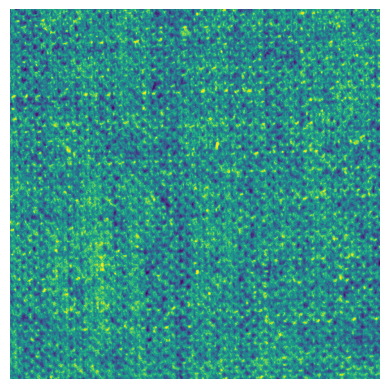

In [18]:
mostrar_ejemplo_de_clase(clases[0])

Ejemplo de la clase cushion1:
Imagen: cushion1-a-p034.png

Descriptores de histograma:
Mean: 0.00390625
R: 0.0207369
Skewness: 9.16314e-08
Flatness: 1.47155e-09
Uniformity: 0.00846562
Entropy: 7.10447


Descriptores de matriz de coocurrencia:


,Distance,Angle,Contrast,Dissimilarity,Homogeneity,Energy,Correlation
0,1,0.0,74.140731,6.485550,0.159724,0.018797,0.976824
1,1,45.0,110.811375,8.121645,0.126836,0.016765,0.965355
2,1,90.0,49.516322,5.355574,0.186440,0.020715,0.984522
3,3,0.0,449.124876,16.123464,0.067037,0.012282,0.859548
4,3,45.0,302.381806,13.496680,0.078688,0.013212,0.905420
5,3,90.0,261.349988,12.409901,0.087930,0.013885,0.918271
6,5,0.0,994.181884,24.275604,0.043401,0.010420,0.688926
7,5,45.0,850.921307,22.804682,0.047924,0.010648,0.733581
8,5,90.0,574.565328,18.432003,0.060910,0.011704,0.820230


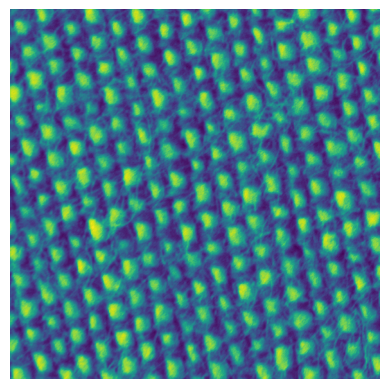

In [19]:
mostrar_ejemplo_de_clase(clases[1])

Ejemplo de la clase linsseeds1:
Imagen: linseeds1-a-p012.png

Descriptores de histograma:
Mean: 0.00390625
R: 0.0169874
Skewness: 1.90167e-08
Flatness: 4.21883e-10
Uniformity: 0.00718935
Entropy: 7.23102


Descriptores de matriz de coocurrencia:


,Distance,Angle,Contrast,Dissimilarity,Homogeneity,Energy,Correlation
0,1,0.0,137.665021,7.190039,0.192809,0.017529,0.956974
1,1,45.0,198.051636,8.744426,0.167854,0.015960,0.938099
2,1,90.0,120.286688,6.893928,0.200474,0.017770,0.962409
3,3,0.0,719.064824,17.588954,0.087467,0.011218,0.775227
4,3,45.0,558.910928,15.276721,0.105067,0.012133,0.825288
5,3,90.0,691.635132,17.435385,0.089973,0.011206,0.783821
6,5,0.0,1263.991493,24.900552,0.058437,0.009308,0.604886
7,5,45.0,1217.923511,24.402624,0.064385,0.009440,0.619167
8,5,90.0,1231.503113,24.640549,0.061267,0.009327,0.615051


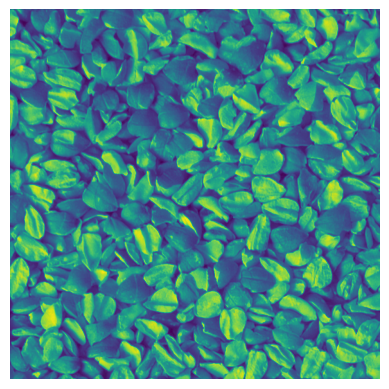

In [20]:
mostrar_ejemplo_de_clase(clases[2])

Ejemplo de la clase sand1:
Imagen: sand1-a-p008.png

Descriptores de histograma:
Mean: 0.00390625
R: 0.0171712
Skewness: 2.21811e-07
Flatness: 3.04405e-09
Uniformity: 0.0121845
Entropy: 6.5458


Descriptores de matriz de coocurrencia:


,Distance,Angle,Contrast,Dissimilarity,Homogeneity,Energy,Correlation
0,1,0.0,99.665694,7.666522,0.142070,0.024997,0.968795
1,1,45.0,126.037115,8.762365,0.122386,0.023312,0.960539
2,1,90.0,49.911156,5.505299,0.185657,0.029287,0.984376
3,3,0.0,694.906556,20.453604,0.055638,0.015734,0.782411
4,3,45.0,423.818624,16.101831,0.068793,0.017448,0.867299
5,3,90.0,354.671796,14.837687,0.073352,0.018112,0.888980
6,5,0.0,1464.700151,29.996987,0.037683,0.013515,0.541422
7,5,45.0,1269.384016,28.078366,0.039544,0.013796,0.602600
8,5,90.0,850.076815,23.025497,0.047947,0.014897,0.733949


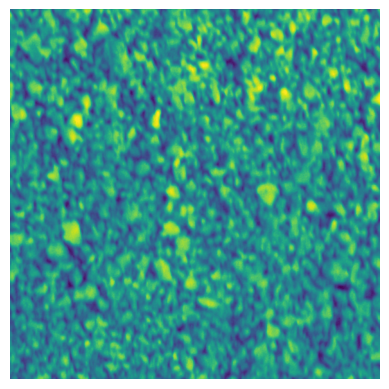

In [21]:
mostrar_ejemplo_de_clase(clases[3])

Ejemplo de la clase seat2:
Imagen: seat2-a-p036.png

Descriptores de histograma:
Mean: 0.00390625
R: 0.0114656
Skewness: 4.16584e-08
Flatness: 5.33787e-10
Uniformity: 0.00848282
Entropy: 7.02086


Descriptores de matriz de coocurrencia:


,Distance,Angle,Contrast,Dissimilarity,Homogeneity,Energy,Correlation
0,1,0.0,627.869405,19.561422,0.055880,0.011314,0.803953
1,1,45.0,822.715454,22.600557,0.046583,0.010624,0.743015
2,1,90.0,536.416528,18.138164,0.059083,0.011683,0.832401
3,3,0.0,1577.820978,31.319257,0.034354,0.009393,0.507353
4,3,45.0,1471.061725,30.332853,0.035212,0.009486,0.540426
5,3,90.0,1489.612717,30.655850,0.034187,0.009457,0.534444
6,5,0.0,2086.613680,36.280797,0.029219,0.008962,0.348446
7,5,45.0,2696.860122,41.688078,0.025069,0.008655,0.157395
8,5,90.0,2344.316100,39.061801,0.026192,0.008771,0.267376


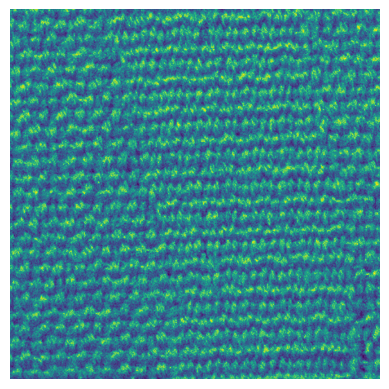

In [22]:
mostrar_ejemplo_de_clase(clases[4])

Ejemplo de la clase stone1:
Imagen: stone1-a-p015.png

Descriptores de histograma:
Mean: 0.00390625
R: 0.0131806
Skewness: 7.98668e-08
Flatness: 9.58386e-10
Uniformity: 0.00943449
Entropy: 6.89463


Descriptores de matriz de coocurrencia:


,Distance,Angle,Contrast,Dissimilarity,Homogeneity,Energy,Correlation
0,1,0.0,144.083167,9.150643,0.119403,0.017984,0.954959
1,1,45.0,251.666846,11.990119,0.093798,0.015853,0.921338
2,1,90.0,140.671030,8.949381,0.124141,0.018283,0.956037
3,3,0.0,850.773521,22.529453,0.049267,0.011814,0.733939
4,3,45.0,720.592110,20.447037,0.055394,0.012382,0.774767
5,3,90.0,835.096722,22.099970,0.051345,0.011972,0.739106
6,5,0.0,1488.507133,30.113136,0.036327,0.010529,0.534254
7,5,45.0,1483.315229,29.878497,0.037569,0.010579,0.536313
8,5,90.0,1439.757829,29.383036,0.038187,0.010650,0.550342


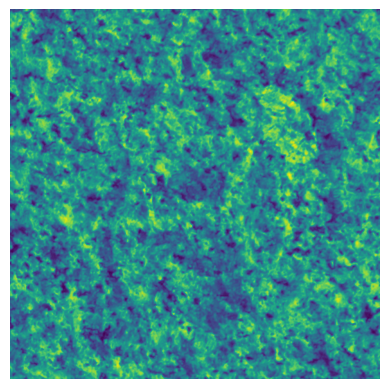

In [23]:
mostrar_ejemplo_de_clase(clases[5])

### 1.2. Ver si algunos de los descriptores calculados permiten discriminar las texturas


#### Analizar gráficamente: Considerar pares de descriptores. Graficar los valores para las imágenes de la base y ver si se separan las clases.

Puede ser conveniente para esto explorar: https://seaborn.pydata.org/generated/seaborn.pairplot.html


In [25]:
clases = ["canvas1", "cushion1", "linsseeds1", "sand1", "seat2", "stone1"]
labels, images = [], []
for clase in clases:
    class_path = os.path.join(dir_base_imagenes, clase)
    for image_name in os.listdir(class_path):
        images.append(
            cv2.imread(os.path.join(class_path, image_name), cv2.IMREAD_GRAYSCALE)
        )
        labels.append(clase)

In [26]:
# Obtener los descriptores de todas las imágenes de la base de texturas
data = []

for img, clase in zip(images, labels):
    # Calcular descriptores de histograma
    (
        mean,
        r,
        skewness,
        flatness,
        uniformity,
        entropy,
    ) = calcular_descriptores_de_histograma(img)
    # Calcular descriptores de matriz de coocurrencia
    (
        contrast,
        dissimilarity,
        homogeneity,
        energy,
        correlation,
    ) = calcular_descriptores_de_matriz_de_coocurrencia(img, distance=1, angle=0)

    data.append(
        [
            clase,
            mean,
            r,
            skewness,
            flatness,
            uniformity,
            entropy,
            contrast,
            dissimilarity,
            homogeneity,
            energy,
            correlation,
        ]
    )

df = pd.DataFrame(
    data,
    columns=[
        "Clase",
        "Mean",
        "R",
        "Skewness",
        "Flatness",
        "Uniformity",
        "Entropy",
        "Contrast",
        "Dissimilarity",
        "Homogeneity",
        "Energy",
        "Correlation",
    ],
)

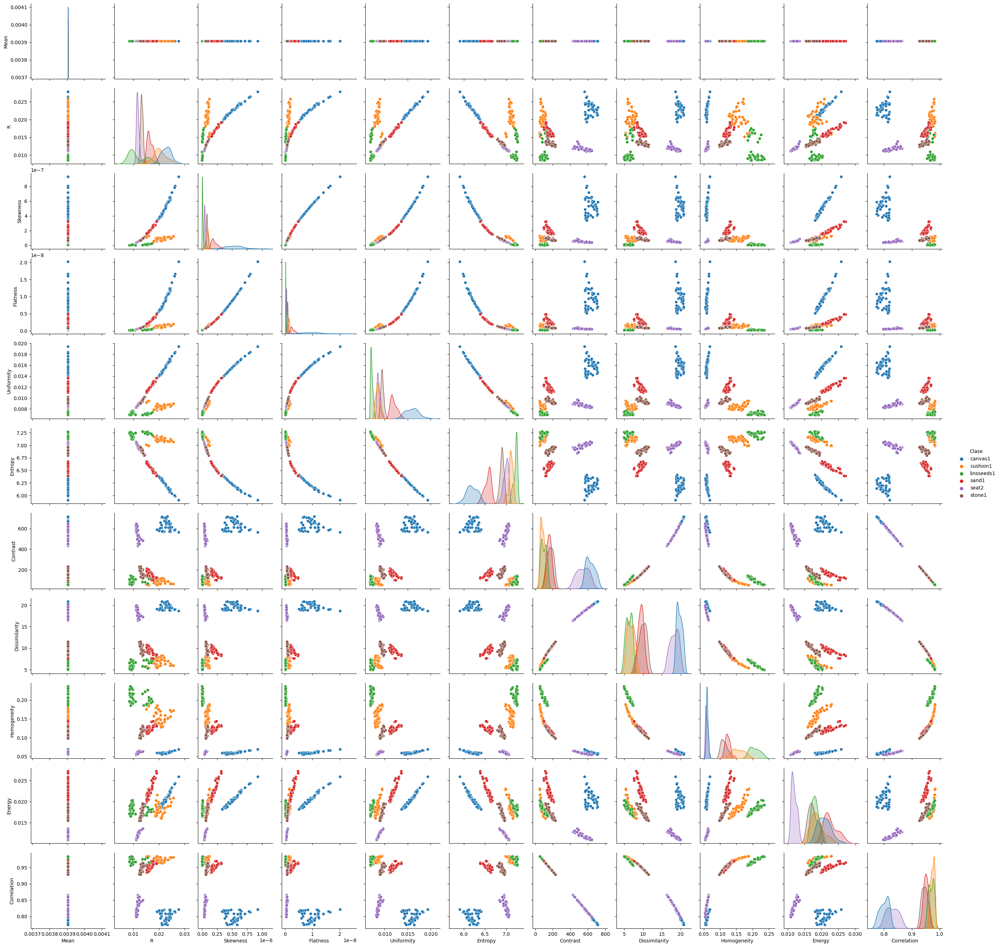

In [24]:
sns.pairplot(
    data=df,
    hue="Clase",
    vars=[
        "Mean",
        "R",
        "Skewness",
        "Flatness",
        "Uniformity",
        "Entropy",
        "Contrast",
        "Dissimilarity",
        "Homogeneity",
        "Energy",
        "Correlation",
    ],
)

#### ¿Existen descriptores que permiten discriminar las texturas de la base? En caso afirmativo, muestre cuáles se podrían usar.


Los pares de variables que mejor separan a las clases de datos parecen ser:

-   Uniformity con Homogeneity
-   Entropy con Homogeneity


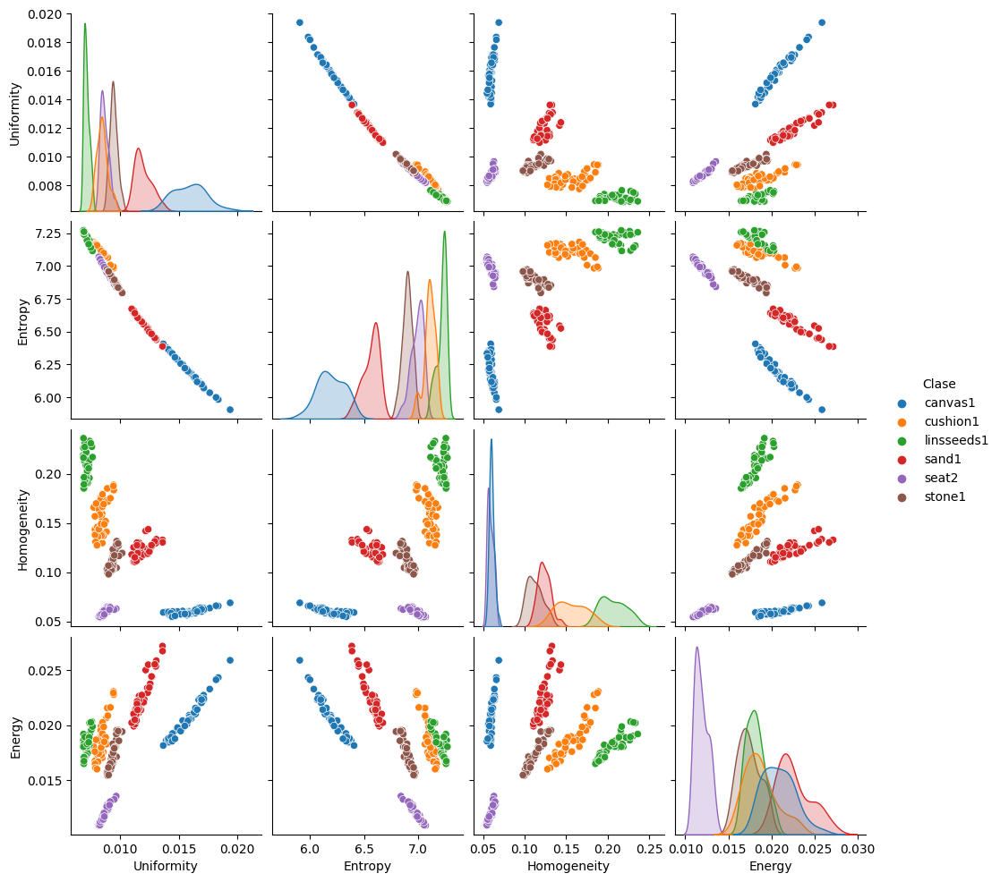

In [25]:
sns.pairplot(
    data=df, hue="Clase", vars=["Uniformity", "Entropy", "Homogeneity", "Energy"]
)

En particular el par Entropy vs Homogeneity pareceria ser el que mejor lo logra


### 1.3. Implementar un clasificador de K vecinos más cercanos

Ver:  
https://scikit-learn.org/stable/modules/generated/sklearn.neighbors.KNeighborsClassifier.html

https://scikit-learn.org/stable/modules/generated/sklearn.model_selection.train_test_split.html

https://scikit-learn.org/stable/modules/generated/sklearn.metrics.confusion_matrix.html  
https://scikit-learn.org/stable/modules/generated/sklearn.metrics.ConfusionMatrixDisplay.html


a) Partir la base de imágenes en 2. De cada clase se usarán 20 imágenes para entrenamiento (conjunto de train) y se usarán las otras 20 imágenes para evaluar el clasificador (conjunto de test)  
b) Calcular sobre todas las imágenes de la base (train y test) las 2 características más relevantes (dos descriptores que se consideren buenos del paso (2) del ejercicio)  
Se armarán los arrays:

-   **X_train**: array de tamaño (cantidad_imagenes_de_la_base/2, 2) donde cada fila tiene las características de una cierta imagen del conjunto de entrenamiento
-   **X_test**: array de tamaño (cantidad_imagenes_de_la_base/2, 2) donde cada fila tiene las características de una cierta imagen del conjunto de test
-   **y_train**: array de tamaño (cantidad_imagenes_de_la_base/2, 1) donde cada fila tiene la clase a la que corresponde una cierta imagen del conjunto de entrenamiento
-   **y_test**: array de tamaño (cantidad_imagenes_de_la_base/2, 1) donde cada fila tiene la clase a la que corresponde una cierta imagen del conjunto de test

c) Crear un clasificador de K vecinos más cercanos (considerar K entre 2 y 5)  
d) Entrenar con el conjunto de entrenamiento  
e) Evaluar el funcionamiento sobre el conjunto de test.

-   Mostrar la tasa de aciertos
-   Mostrar la matriz de confusion de clases


In [27]:
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import accuracy_score, confusion_matrix, ConfusionMatrixDisplay

In [28]:
descriptors = []

for img in images:
    # Calcular descriptores de histograma
    _, _, _, _, _, entropy = calcular_descriptores_de_histograma(img)
    # Calcular descriptores de matriz de coocurrencia
    _, _, homogeneity, _, _ = calcular_descriptores_de_matriz_de_coocurrencia(
        img, distance=1, angle=0
    )

    descriptors.append([entropy, homogeneity])

In [29]:
# Partir la base en conjuntos de entrenamiento y prueba
# el parametro stratify es quien asegura que se mantenga la proporcion de clases en cada conjunto (40*0.5=20 de cada clase)
X_train, X_test, y_train, y_test = train_test_split(
    descriptors, labels, test_size=0.5, stratify=labels, random_state=0
)

Tasa de aciertos: 100.00%


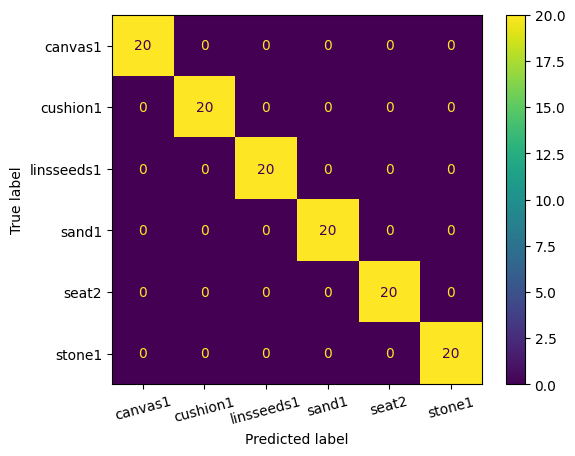

In [30]:
# Crear un clasificador de K vecinos más cercanos
k = 2  # Tasa Aciertos: TA(k=2)=100.00% TA(k=3)=98.33% TA(k=4)=98.33% TA(k=5)=97.50%
clasificador = KNeighborsClassifier(n_neighbors=k)

# Entrenar el clasificador con el conjunto de entrenamiento
clasificador.fit(X_train, y_train)

# Evaluar el funcionamiento del clasificador sobre el conjunto de prueba
predicciones = clasificador.predict(X_test)

# Calcular la tasa de aciertos
tasa_aciertos = accuracy_score(y_test, predicciones)
print(f"Tasa de aciertos: {tasa_aciertos * 100:.2f}%")

# Calcular la matriz de confusión de clases
matriz_confusion = confusion_matrix(y_test, predicciones)

_ = ConfusionMatrixDisplay(
    confusion_matrix=matriz_confusion, display_labels=clases
).plot(xticks_rotation=15)

## 2 Detección y matching de puntos SIFT


### 2.1 Escribir un programa que dadas dos imágenes calcule puntos SIFT y realice el matching de los mismos

**Implementar mediante funciones de OpenCV**  
Ver:  
https://docs.opencv.org/4.7.0/da/df5/tutorial_py_sift_intro.html  
https://docs.opencv.org/4.7.0/dc/dc3/tutorial_py_matcher.html

**Explicar todos los parámetros de las funciones usadas y el criterio tomado para elegir cada uno de ellos**


In [2]:
def calcular_sift_matching(train_img, query_img):
    # Crear el objeto SIFT con los valores por defecto.
    sift = cv2.SIFT_create()
    # Detectar y calcular los puntos SIFT y los descriptores en las imágenes.
    tr_kpts, tr_desc = sift.detectAndCompute(image=train_img, mask=None)
    q_kpts, q_desc = sift.detectAndCompute(image=query_img, mask=None)
    # creacion del matcher, utiliza un algoritmo de fuerza bruta. valores por defecto
    # la norma utilizada L2, la distancia euclidea
    # crossMatch no es necesario porque vamos a usar el ratio test
    bf = cv2.BFMatcher_create()
    # Realizar el matching de los descriptores
    # Vamos a considerar los 2 mejores matches, de esta forma podremos aplicar el
    # test utilizado por D.Lowe en el paper.
    matches = bf.knnMatch(queryDescriptors=q_desc, trainDescriptors=tr_desc, k=2)
    # Aplicacion de un filtro para seleccionar los mejores matches.
    # Este se conoce como ratio test, filtra matches potencialmente ambiguos asegurnado
    # que la distancia entre el mejor match y el segundo mejor match sea mayor a un umbral.
    # Generalmente se usa 0.7 o 0.75
    good_matches = []
    for m, n in matches:
        if m.distance < 0.75 * n.distance:
            good_matches.append(m)
    return good_matches, (tr_kpts, q_kpts), (tr_desc, q_desc)

### 2.2 Mostrar el resultado de detectar y matchear para las imágenes "peppers_dark" y "peppers_rotada"

**a) Mostrar gráficamente los matches  
b) Para los 3 matches más fuertes, mostrarlos en las imágenes y analizar los descriptores correspondientes (escala, ángulo, histograma de orientaciones locales, etc)  
c) Algunos de los matches son erroneos (los puntos matcheados no corresponden a la misma zona de la imagen). Analizar, como en (b) alguno de estos matches erroneos.**


In [43]:
read_img = lambda name: cv2.imread(
    os.path.join(dir_zip_imagenes, name), cv2.IMREAD_GRAYSCALE
)
peppers_dark = read_img("peppers_dark.png")
peppers_rot = read_img("peppers_rotada.png")

#### Visualizacion de matches


Cantidad de matches encontrados: 155


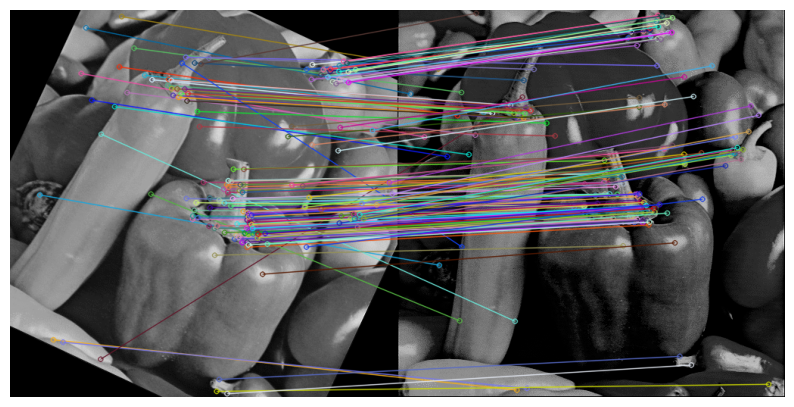

In [44]:
matches, keypoints, descriptors = calcular_sift_matching(peppers_dark, peppers_rot)
print("Cantidad de matches encontrados:", len(matches))
matching_result = cv2.drawMatches(
    peppers_rot,
    keypoints[1],
    peppers_dark,
    keypoints[0],
    matches,
    None,
    flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS,
)
plt.figure(figsize=(10, 10))
plt.imshow(matching_result)
plt.axis("off")
plt.show()

#### Matches mas fuertes


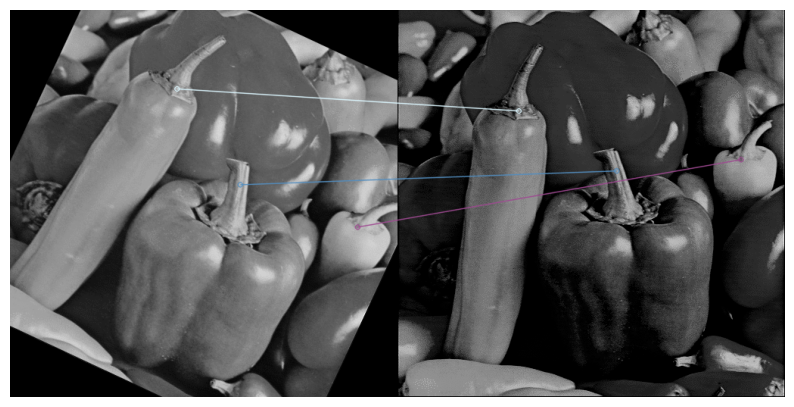

In [5]:
# Si buscamos matches fuertes tenemos que considerar distancias chicas porque en este contexto la 'distancia' es una medida de similitud. distancia pequeña implica similaridad alta entre descriptores.
top_3_idxs = np.argsort([m.distance for m in matches])[:3]
top_3_mask = np.zeros(len(matches), dtype=int)
for idx in top_3_idxs:
    top_3_mask[idx] = 1
matching_result = cv2.drawMatches(
    peppers_rot,
    keypoints[1],
    peppers_dark,
    keypoints[0],
    matches,
    None,
    matchesMask=top_3_mask,
    flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS,
)
plt.figure(figsize=(10, 10))
plt.imshow(matching_result)
plt.axis("off")
plt.show()

Match: 370 - 338 (distance=52.90)
Keypoint1: Scale=4.22, Angle=7.51
Keypoint2: Scale=4.05, Angle=340.61
-------------------------
Match: 571 - 589 (distance=56.28)
Keypoint1: Scale=3.32, Angle=30.58
Keypoint2: Scale=3.32, Angle=3.65
-------------------------
Match: 230 - 188 (distance=59.80)
Keypoint1: Scale=2.41, Angle=11.36
Keypoint2: Scale=2.43, Angle=345.69
-------------------------


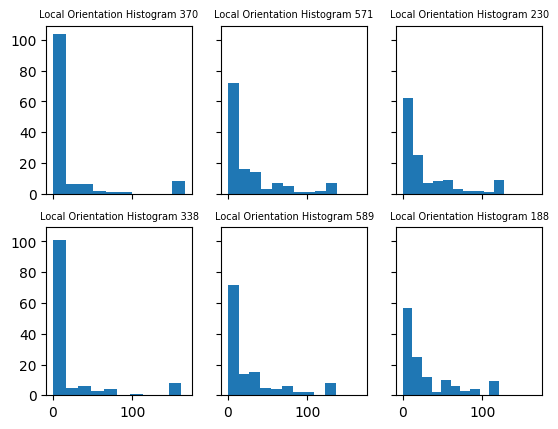

In [6]:
fig, axs = plt.subplots(2, 3, sharex=True, sharey=True)

for idx, match in enumerate([matches[idx] for idx in top_3_idxs]):
    # obtener keypoints y descriptores de los matches
    rot_idx, pep_idx = match.queryIdx, match.trainIdx
    kpt1, kpt2 = keypoints[1][rot_idx], keypoints[0][pep_idx]
    des1, des2 = descriptors[1][rot_idx], descriptors[0][pep_idx]

    print(f"Match: {rot_idx} - {pep_idx} (distance={match.distance:.2f})")
    print(f"Keypoint1: Scale={kpt1.size:.2f}, Angle={kpt1.angle:.2f}")
    print(f"Keypoint2: Scale={kpt2.size:.2f}, Angle={kpt2.angle:.2f}")
    print("-------------------------")

    axs[0, idx].set_title(f"Local Orientation Histogram {rot_idx}", fontsize=7)
    axs[0, idx].hist(des1)
    axs[1, idx].set_title(f"Local Orientation Histogram {pep_idx}", fontsize=7)
    axs[1, idx].hist(des2)

#### Matches erroneos


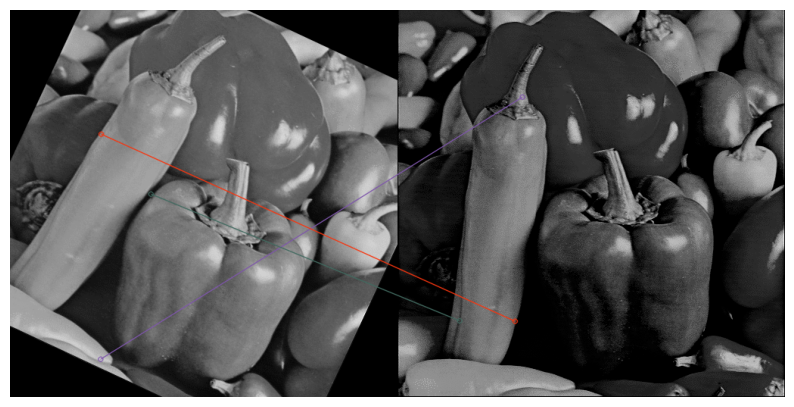

In [7]:
idx_erroneos = np.argsort([m.distance for m in matches])[[-17, 26, -38]]
erroneosMask = np.zeros(len(matches), dtype=int)
for idx in idx_erroneos:
    erroneosMask[idx] = 1

matching_result = cv2.drawMatches(
    peppers_rot,
    keypoints[1],
    peppers_dark,
    keypoints[0],
    matches,
    None,
    matchesMask=erroneosMask,
    flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS,
)

plt.figure(figsize=(10, 10))
plt.imshow(matching_result)
plt.axis("off")
plt.show()

Match: 149 - 196 (distance=227.93)
Keypoint1: Scale=3.82, Angle=289.97
Keypoint2: Scale=1.92, Angle=160.46
-------------------------
Match: 150 - 177 (distance=88.79)
Keypoint1: Scale=2.29, Angle=38.42
Keypoint2: Scale=2.18, Angle=198.77
-------------------------
Match: 190 - 94 (distance=195.26)
Keypoint1: Scale=8.37, Angle=222.44
Keypoint2: Scale=2.73, Angle=8.64
-------------------------


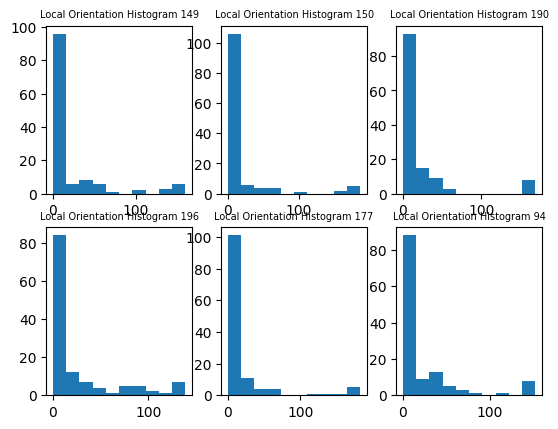

In [8]:
fig, axs = plt.subplots(2, 3)

for idx, match in enumerate([matches[idx] for idx in idx_erroneos]):
    rot_idx, pep_idx = match.queryIdx, match.trainIdx
    kpt1, kpt2 = keypoints[1][rot_idx], keypoints[0][pep_idx]
    des1, des2 = descriptors[1][rot_idx], descriptors[0][pep_idx]

    print(f"Match: {rot_idx} - {pep_idx} (distance={match.distance:.2f})")
    print(f"Keypoint1: Scale={kpt1.size:.2f}, Angle={kpt1.angle:.2f}")
    print(f"Keypoint2: Scale={kpt2.size:.2f}, Angle={kpt2.angle:.2f}")
    print("-------------------------")

    axs[0, idx].set_title(f"Local Orientation Histogram {rot_idx}", fontsize=7)
    axs[0, idx].hist(des1)
    axs[1, idx].set_title(f"Local Orientation Histogram {pep_idx}", fontsize=7)
    axs[1, idx].hist(des2)

In [10]:
import pandas as pd


def angle_difference(angle1, angle2):
    diff = (angle2 - angle1) % 360
    return diff if diff <= 180 else 360 - diff


sizes, angles, match_id, correct, sim_hist = [], [], [], [], []

for idx, match in enumerate(
    [matches[idx] for idx in np.concatenate([top_3_idxs, idx_erroneos])]
):
    img1_idx, img2_idx = match.queryIdx, match.trainIdx
    kpt1, kpt2 = keypoints[0][img1_idx], keypoints[1][img2_idx]
    des1, des2 = descriptors[0][img1_idx], descriptors[1][img2_idx]

    match_id.append((img1_idx, img2_idx))
    sizes.append(np.abs(kpt1.size - kpt2.size))
    angles.append(angle_difference(kpt1.angle, kpt2.angle))

    # Cuanto menor sea el valor de la distancia de Chi-cuadrado, mayor será la similitud entre los histogramas
    sim_hist.append(
        cv2.compareHist(
            np.histogram(des1)[0].astype(np.float32),
            np.histogram(des2)[0].astype(np.float32),
            cv2.HISTCMP_CHISQR,
        )
    )

data_df = pd.DataFrame(
    {
        "Match": match_id,
        "Size": sizes,
        "Angle": angles,
        "Hist_Similarity": sim_hist,
        "Correct": [True, True, True, False, False, False],
    }
)

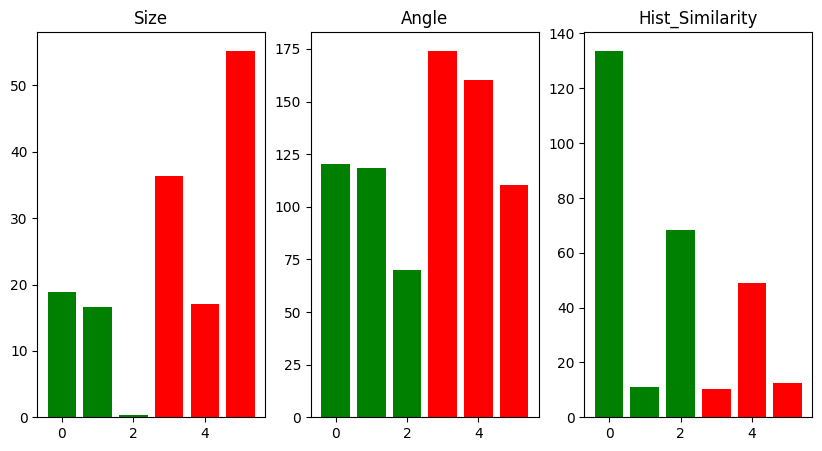

In [12]:
fig, ax = plt.subplots(1, 3, figsize=(10, 5))
colors = data_df["Correct"].map({True: "g", False: "r"})
size, angle, hist_sim = data_df["Size"], data_df["Angle"], data_df["Hist_Similarity"]

for idx, col in enumerate(["Size", "Angle", "Hist_Similarity"]):
    ax[idx].bar(range(len(data_df)), data_df[col], color=colors)
    ax[idx].set_title(col)

Vemos como una diferencia menor entre los valores de los descritptores de las features matcheadas generalmente implica un match correcto. Esto se observa tanto para el angulo y la escala pero no para la similitud entre los histogramas de orientaciones locales (en este caso, tal vez sea coincidencia por la utilizacion de pocas muestras).


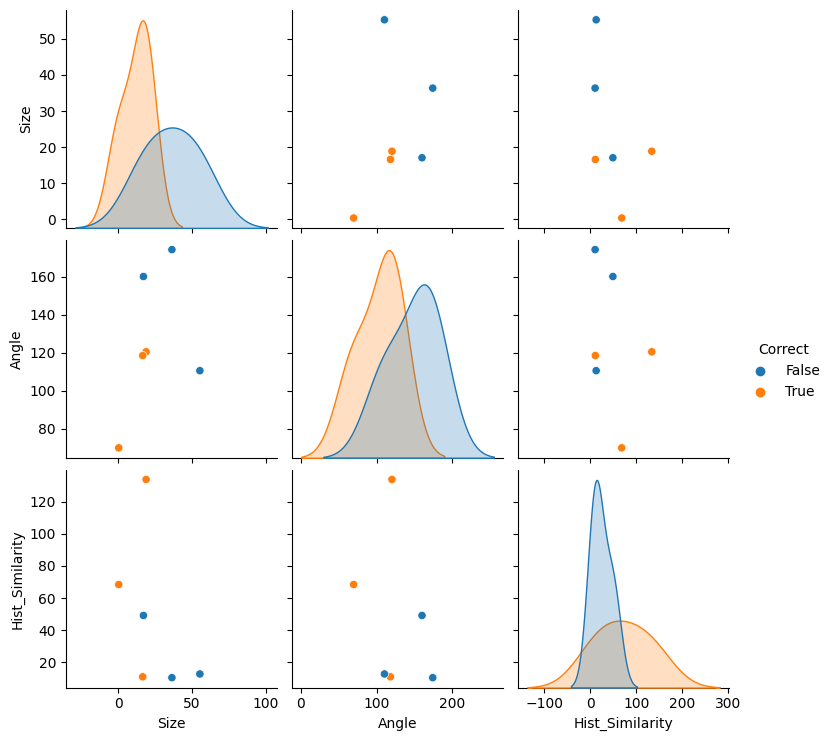

In [367]:
import seaborn as sns

sns.pairplot(data_df, hue="Correct", vars=["Size", "Angle", "Hist_Similarity"])

Podemos ver devuelta cierta tendencia, los matches correctos tienen valores de los descriptores parecidos, es decir si el keypoint_i hizo match con el keypoint_j y es bueno probablemrnte tendran Angulo, Escala e Histograma de Orientaciones Locales similares.

Para los matches incorrectos vemos que ocurre lo opuesto, suelen tener grandes diferencias en los valores de los descriptores.


### 2.3 Estimar, de forma robusta, la homografía entre las imágenes a partir de los matches

A partir de la correspondencia entre puntos característicos, es posible determinar la transformación plana que relaciona las dos imágenes pero, como se vio en 2.2, no hay garantía que todas las correspondencias del matching sean buenas. Es necesario entonces estimar la homografía de forma robusta reconociendo cuáles son las correspondencias buenas (las llamaremos inliers) y descartando las malas (que llamaremos outliers).  
El cálculo robusto de la homografía se implementará mediante RANSAC.

Para esta parte puede ser interesante ver las secciones 4.7 y 4.8 del libro:  
Multiple View Geometry in Computer Vision (Second Edition)  
Richard Hartley and Andrew Zisserman, Cambridge University Press, March 2004.  
https://www.robots.ox.ac.uk/~vgg/hzbook/


**Investigar RANSAC.  
Explicar la idea general de RANSAC y su aplicación para la estimación robusta de una homografía**


RANSAC (Random Sample Consensus) es un algoritmo utilizado para la estimación robusta de parámetros en presencia de datos ruidosos y outliers.
Se aplica comúnmente en el campo de la visión por computadora para encontrar una solución que se ajuste mejor a un conjunto de datos.

La idea general de RANSAC es:

1. Seleccionar aleatoriamente un subconjunto mínimo de puntos del conjunto de datos original. Este subconjunto se denomina "conjunto de muestra" o "conjunto de inliers hipotéticos".

2. Estimar los parámetros del modelo utilizando el conjunto de muestra seleccionado. En el caso de la estimación de una homografía, los parámetros del modelo representan la transformación plana que relaciona las dos imágenes.

3. Calcular la medida de ajuste del modelo estimado para cada punto del conjunto de datos original. Esta medida de ajuste puede ser una distancia o un error definido según el problema específico.

4. Contar el número de puntos que se ajustan al modelo dentro de un umbral de error predefinido. Estos puntos se denominan "inliers", ya que se espera que representen las correspondencias correctas o las características que siguen el modelo subyacente.

5. Repetir los pasos 1-4 un número determinado de veces. Esto se hace para asegurar que se exploran diferentes combinaciones de puntos y modelos.

6. Seleccionar el modelo que tiene el mayor número de inliers. Este modelo se considera la mejor estimación inicial.

7. Reestimar los parámetros del modelo utilizando todos los inliers encontrados. Esta etapa final de reestimación se realiza para obtener una estimación más precisa de los parámetros del modelo.

En el caso de la estimación de una homografía, RANSAC se utiliza para obtener una transformación plana robusta y precisa entre imágenes, incluso cuando existen correspondencias erróneas o puntos atípicos.


#### Implementar la estimación de una homografía usando RANSAC


In [33]:
def estimar_homografia_con_ransac(
    puntos_ori, puntos_dst, iteraciones, umbral_distancia
):
    """
    Estima una homografía usando RANSAC

    Parameters
    ----------
    puntos_ori : array Nx2 de coordenadas de puntos
        Puntos origen.
    puntos_dst : array Nx2 de coordenadas de puntos
        Puntos destino.
    iteraciones : int
        Cantidad de repeticiones del muestreo y cálculo de posibles homografías.
    umbral_distancia : double
        Umbral para evaluar la distancia entre un punto destino y su
        correspondiente proyectado por la homografía en evaluación.

    Returns
    -------
    H : array 3x3
        Homografía estimada.
    indices_inliers : array
        Lista de los índices que resultaron inliers de H.
    indices_outliers : array
        Lista de los índices que resultaron outliers de H.

    """
    # https://es.wikipedia.org/wiki/RANSAC
    # https://github.com/scikit-image/scikit-image/blob/main/skimage/measure/fit.py

    num_samples = puntos_ori.shape[0]
    max_inliers, best_residuals = 0, np.inf
    indices_inliers, indices_outliers = None, None

    rng = np.random.default_rng(seed=0)
    min_samples = 4

    for _ in range(iteraciones):
        # seleccionar aleatoriamente 4 puntos (sin repeticion)
        rand_idxs = rng.choice(num_samples, min_samples, replace=False)
        src_rand, dst_rand = puntos_ori[rand_idxs], puntos_dst[rand_idxs]

        # calcular la homografía con los puntos seleccionados usando un metodo no robusto
        H_k, _ = cv2.findHomography(src_rand, dst_rand, method=0)
        # proyectar los puntos destino utilizando la homografía estimada
        puntos_proyectados = cv2.perspectiveTransform(
            puntos_ori.reshape(-1, 1, 2), H_k
        ).reshape(-1, 2)

        # calcular la distancia entre los puntos proyectados y los puntos destino
        distances_k = np.linalg.norm(puntos_proyectados - puntos_dst, axis=1)
        # metrica de error del modelo
        residuals_k = np.linalg.norm(puntos_proyectados - puntos_dst)

        # determinar los inliers y outliers basados en el umbral de distancia elegido
        inliers_k = np.where(distances_k < umbral_distancia)[0]
        outliers_k = np.where(distances_k >= umbral_distancia)[0]
        num_inliers_k = len(inliers_k)

        # actualizacion si se encontro un mejor conjunto de inliers
        if num_inliers_k > max_inliers or (
            num_inliers_k == max_inliers and residuals_k < best_residuals
        ):
            best_residuals = residuals_k
            max_inliers = num_inliers_k
            H = H_k
            indices_inliers = inliers_k
            indices_outliers = outliers_k

    return H, indices_inliers, indices_outliers

#### Estimar la homografía para las correspondencias encontradas entre las imágenes "peppers_dark" y "peppers_rotada"

**a) Mostrar los resultados numéricos (H,cantidad de inliers y outliers, etc.)  
b) Mostrar gráficamente las correspondencias inliers y outliers**


Homografía estimada:
[[ 8.96086339e-01 -4.28285181e-01  1.34348793e+02]
 [ 4.16239689e-01  8.95397342e-01 -8.18327654e+01]
 [-9.11804417e-06 -1.75280413e-05  1.00000000e+00]]
Cantidad de inliers: 147
Cantidad de outliers: 8


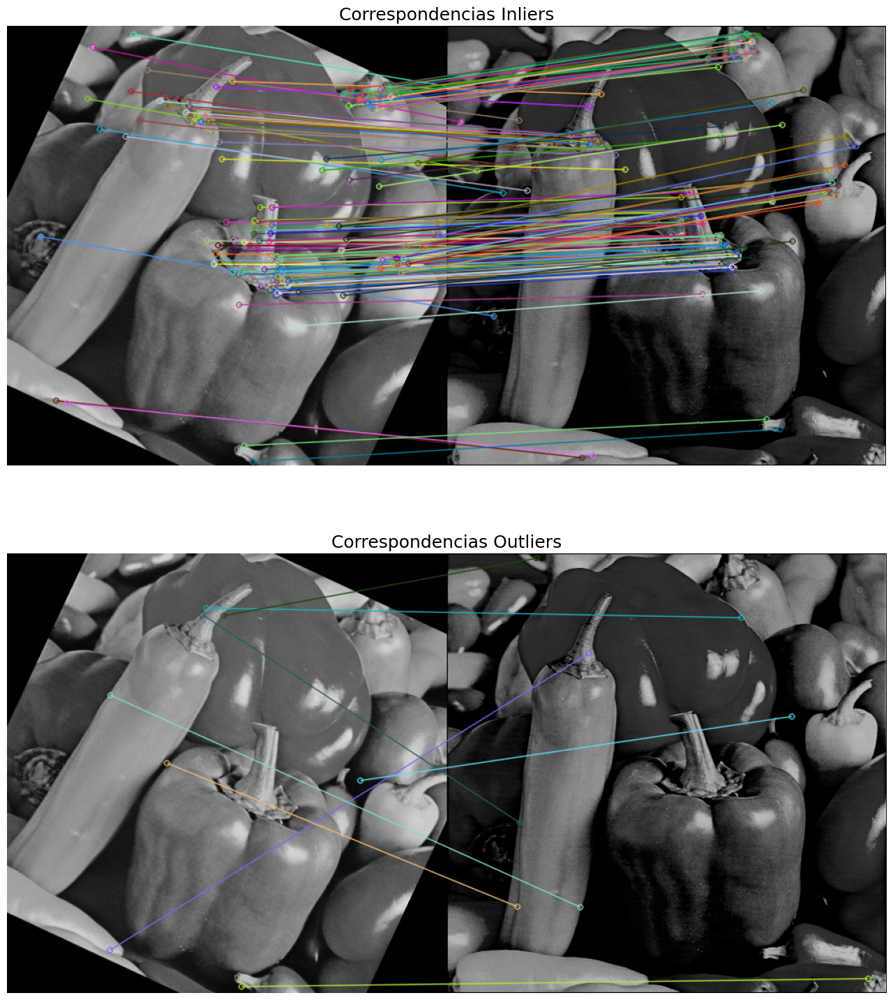

In [46]:
# obtener puntos origen y destino
src_pts = np.float32([keypoints[0][m.trainIdx].pt for m in matches]).reshape(-1, 2)
dst_pts = np.float32([keypoints[1][m.queryIdx].pt for m in matches]).reshape(-1, 2)

H, inliers, outliers = estimar_homografia_con_ransac(
    src_pts, dst_pts, iteraciones=1000, umbral_distancia=5
)

print("Homografía estimada:")
print(H)
print("Cantidad de inliers:", len(inliers))
print("Cantidad de outliers:", len(outliers))

# mostrar las correspondencias inliers y outliers

drawn_image = lambda mask: cv2.drawMatches(
    peppers_rot,
    keypoints[1],
    peppers_dark,
    keypoints[0],
    matches,
    None,
    matchesMask=mask,
    flags=cv2.DrawMatchesFlags_NOT_DRAW_SINGLE_POINTS,
)

mask_inliers = np.zeros(len(matches), dtype=int)
mask_inliers[inliers] = 1
img_inliers = drawn_image(mask_inliers)

mask_outliers = np.zeros(len(matches), dtype=int)
mask_outliers[outliers] = 1
img_outliers = drawn_image(mask_outliers)

fig, ax = plt.subplots(2, 1, figsize=(20, 18))
ax[0].imshow(img_inliers)
ax[0].set_title("Correspondencias Inliers", fontsize=18)
ax[1].imshow(img_outliers)
ax[1].set_title("Correspondencias Outliers", fontsize=18)

_ = [a.axis("off") for a in ax]
plt.show()

### 2.4 Aplicación: Reconocimiento automático de productos de supermercado


El objetivo es reconocer automáticamente y encontrar la orientación en la imagen de productos de supermercado cuando éstos son mostrados a la cámara utilizando matching de puntos SIFT.

**Imágenes base**  
Obtener las imágenes de productos en páginas web de supermercados. Se usarán 4 imágenes base de productos que a su vez tengan en su casa.

**Imágenes a reconocer**  
Se adquirirán 6 imágenes de cada uno de los productos reales con variación de distancia, orientación y posición. Se adquirirán además 6 imágenes sin ningún producto.

A modo de ejemplo se incluyen dos imágenes base de productos e imágenes a reconocer (ver imagenes/productos).

**Se implementará un programa que**, dada una imagen a reconocer:

a) Determine si está presente o no alguno de los productos de las imágenes base  
b) En caso de haber un producto presente en la imágen se debe

-   indicar cuál es el producto
-   estimar la homografía entre producto base y producto real
-   mostrar, sobre la imagen a reconocer, el recuadro del producto calculado usando la homografía


In [90]:
def read_img(path):
    return cv2.imread(path, cv2.IMREAD_GRAYSCALE)


def path(*strings):
    return os.path.join(*strings)


dir_productos = path(dir_zip_imagenes, "productos")

dir_productos_base = path(dir_productos, "imagenes_base")
dir_productos_recon = path(dir_productos, "imagenes_a_reconocer")

#### Ejemplos


In [104]:
def recognize_product(image_to_recognize_path, images_base, threshold_inliers=10):
    recon = read_img(image_to_recognize_path)
    for path in images_base:
        base = read_img(path)
        good_matches, (train_kps, query_kps), _ = calcular_sift_matching(
            query_img=base, train_img=recon
        )

        src_pts = np.float32([query_kps[m.queryIdx].pt for m in good_matches]).reshape(
            -1, 2
        )
        dst_pts = np.float32([train_kps[m.trainIdx].pt for m in good_matches]).reshape(
            -1, 2
        )

        H, indices_inliers, _ = estimar_homografia_con_ransac(
            src_pts, dst_pts, iteraciones=1000, umbral_distancia=5
        )

        if len(indices_inliers) < threshold_inliers:
            print(f"Producto no reconocido: {path}")
            return

        matchesMask = np.zeros(len(good_matches), dtype=int)
        matchesMask[indices_inliers] = 1

        h, w = base.shape[:2]
        pts = np.float32([[0, 0], [0, h - 1], [w - 1, h - 1], [w - 1, 0]]).reshape(
            -1, 1, 2
        )
        dst = cv2.perspectiveTransform(pts, H)
        dst += (w, 0)  # agregar offset de la iamge
        draw_params = dict(
            matchColor=(0, 255, 0),
            singlePointColor=None,
            matchesMask=matchesMask,
            flags=2,
        )
        img3 = cv2.drawMatches(
            base, query_kps, recon, train_kps, good_matches, None, **draw_params
        )

        # Draw bounding box in Red
        img3 = cv2.polylines(img3, [np.int32(dst)], True, (0, 0, 255), 3, cv2.LINE_AA)
        plt.imshow(img3)
        plt.axis("off")

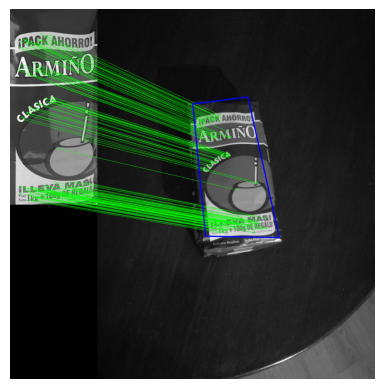

In [105]:
# Usage example
base_images = [path(dir_productos_base, "yerba.jpg")]
images_to_recognize = [
    path(dir_productos_recon, f"yerba_{i}.jpeg") for i in range(1, 7)
]

recognize_product(images_to_recognize[0], base_images)

In [106]:
recognize_product(os.path.join(dir_productos_recon, "fing.jpeg"), base_images)

Producto no reconocido: ./imagenes/productos/imagenes_base/yerba.jpg


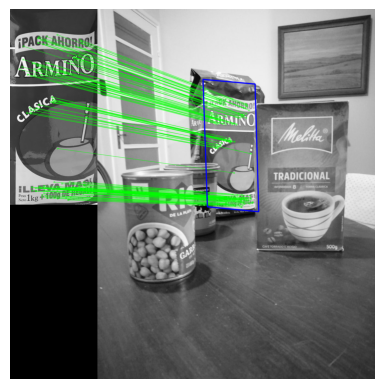

In [107]:
recognize_product(os.path.join(dir_productos_recon, "productos_1.jpeg"), base_images)

#### Implementacion Final


In [108]:
import seaborn as sns
import matplotlib.patches as mpatches
from dataclasses import dataclass
from typing import Iterable, Tuple

RGBtuple = Tuple[int, int, int]
Image = np.ndarray


@dataclass(frozen=True)  # estaria bueno usar slots=True pero es de Python 3.10
class Product:
    name: str
    image: np.ndarray

    def __iter__(self):  # par que sea un-packable a,b=c
        return iter((self.name, self.image))


class Recognizer:
    def __init__(self, threshold_inliers: int = 15, threshold_distance: float = 0.75):
        self.threshold_distance = threshold_distance  # para el ratio test
        self.threshold_inliers = threshold_inliers  # determina si se reconoce o no
        self.base_descriptors = []  # guardara los descriptores de las imagenes base
        self.base_features = []  # guardara los keypoints de las imagenes base
        self.product_names = []  # guardara los nombres de los productos
        self.corners = []  # guardara los vertices de las imagenes base
        self.sift = cv2.SIFT_create()

    def _get_rgb(self, index: int) -> RGBtuple:
        return tuple(int(x * 255) for x in self.pallete[index])

    def show_keypoints(self, image: Image, ax: plt.Axes = None) -> None:
        output_image = cv2.drawKeypoints(
            image=cv2.cvtColor(image, cv2.COLOR_GRAY2BGR),
            keypoints=self.sift.detect(image, None),
            outImage=0,
            color=(255, 0, 0),
            flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS,
        )
        if ax is None:
            ax = plt.gca()
        ax.imshow(output_image)
        ax.axis("off")

    def fit(self, base_data: Iterable[Product]) -> "Recognizer":
        # precomputacion de datos sobre la base de imagenes
        for name, image in base_data:
            keypoints, descriptors = self.sift.detectAndCompute(image, None)
            self.product_names.append(name)
            self.base_features.append(keypoints)
            self.base_descriptors.append(descriptors)

            # esquinas de cada imagen (para dibujar los bounding boxes)
            h, w = image.shape
            self.corners.append(
                np.float32([[0, 0], [0, h - 1], [w - 1, h - 1], [w - 1, 0]]).reshape(
                    -1, 1, 2
                )
            )

        # mapeo de entero 0..nro_productos a colores RGB distintos
        self.pallete = sns.color_palette("hsv", len(self.product_names))
        self.legend_patches = [
            mpatches.Patch(
                color=np.array(self._get_rgb(idx)) / 255, label=f"{label} ({idx})"
            )
            for idx, label in enumerate(self.product_names)
        ]

        return self

    def predict(self, image: Image) -> Tuple[Image, np.ndarray[int]]:
        image_with_boxes = cv2.cvtColor(image, cv2.COLOR_GRAY2BGR)
        # cantidad de inliers reconocidos de cada producto de la base
        confidence = np.zeros(len(self.product_names), dtype=np.uint8)

        # calculo de keypoints y descriptores de la imagen a reconocer
        keypoints, descriptors = self.sift.detectAndCompute(image, None)
        matcher = cv2.BFMatcher_create()

        for idx, (base_desc, base_kpts, base_corners) in enumerate(
            zip(self.base_descriptors, self.base_features, self.corners)
        ):
            ## MATCHING
            matches = matcher.knnMatch(
                queryDescriptors=descriptors, trainDescriptors=base_desc, k=2
            )
            good_matches = [
                m
                for m, n in matches
                if m.distance < self.threshold_distance * n.distance
            ]

            ## RANSAC
            base_img_pts, rec_img_pts = [], []
            for m in good_matches:
                base_img_pts.append(base_kpts[m.trainIdx].pt)
                rec_img_pts.append(keypoints[m.queryIdx].pt)
            # encontrar homografia entre los puntos de la imagen base y los de la imagen a reconocer
            H, mask = cv2.findHomography(
                np.float32(base_img_pts).reshape(-1, 1, 2),
                np.float32(rec_img_pts).reshape(-1, 1, 2),
                cv2.RANSAC,
                5.0,
            )
            inliers = mask.ravel().tolist()

            confidence[idx] = sum(inliers)
            ## DRAWING
            # si se considera el producto 'reconocido'
            if confidence[idx] >= self.threshold_inliers:
                # dibujar el bounding box correspondiente
                transformed_corners = cv2.perspectiveTransform(base_corners, H)
                image_with_boxes = cv2.polylines(
                    image_with_boxes,
                    [np.int32(transformed_corners)],
                    isClosed=True,
                    color=self._get_rgb(idx),
                    thickness=5,
                    lineType=cv2.LINE_AA,
                )

        return image_with_boxes, confidence

    def show_predictions(
        self,
        images: Iterable[Image],
        fig: plt.Figure,
        axs: np.ndarray[plt.Axes],
        show_inliers: bool = True,
    ) -> None:
        if type(axs) is not np.ndarray:
            axs = np.array(axs)

        for image, ax in zip(images, axs.flat):
            image_with_boxes, inliers = self.predict(image)

            # muestra la cantidad de inliers hallados para cada producto de la base
            if show_inliers:
                ax.set_title(np.array2string(inliers, separator=","), fontsize=8)

            ax.axis("off")
            ax.imshow(image_with_boxes)

        # agrega leyenda: <color> <nombre> <(indice)> para cada producto de la base
        fig.legend(
            handles=self.legend_patches, loc="center right", bbox_to_anchor=(1.3, 0.5)
        )
        fig.tight_layout()

In [109]:
rec = Recognizer().fit(
    [
        Product("yerba", read_img(path(dir_productos_base, "yerba.jpg"))),
        Product("cafe", read_img(path(dir_productos_base, "cafe_melitta.jpg"))),
    ]
)

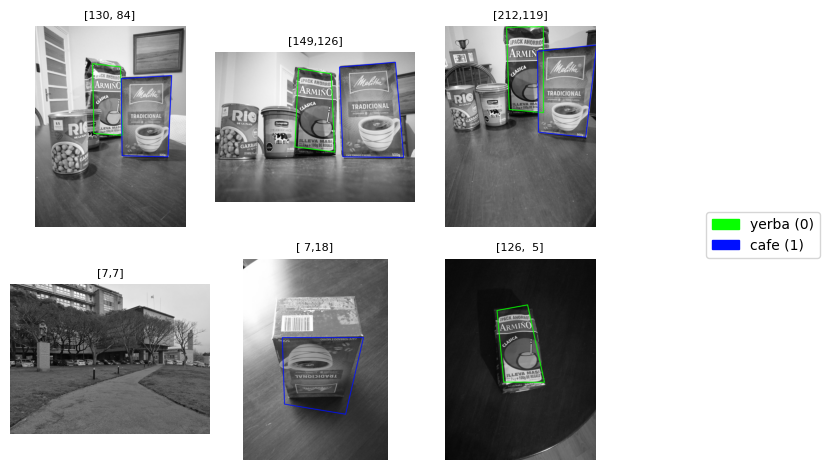

In [110]:
# algunos ejemplos
img_names = [
    "productos_1.jpeg",
    "productos_2.jpeg",
    "productos_3.jpeg",
    "fing.jpeg",
    "melitta_1.jpeg",
    "yerba_1.jpeg",
]
imgs_to_recon = (read_img(path(dir_productos_recon, name)) for name in img_names)

fig, ax = plt.subplots(2, 3)
rec.show_predictions(imgs_to_recon, fig, ax)

In [111]:
dir_mis_productos = path(dir_productos, "mis_productos")
dir_mis_productos_base = path(dir_mis_productos, "imagenes_base")
dir_mis_productos_recon = path(dir_mis_productos, "imagenes_a_reconocer")

rec = Recognizer().fit(
    [
        Product(
            "champiniones",
            read_img(path(dir_mis_productos_base, "lata-champiniones-emigrante.webp")),
        ),
        Product(
            "salsa de soja",
            read_img(path(dir_mis_productos_base, "soy-sauce-heinz.webp")),
        ),
        Product(
            "axe", read_img(path(dir_mis_productos_base, "desodorante-axe-marine.webp"))
        ),
        Product("royal", read_img(path(dir_mis_productos_base, "polvo-royal.png"))),
    ]
)

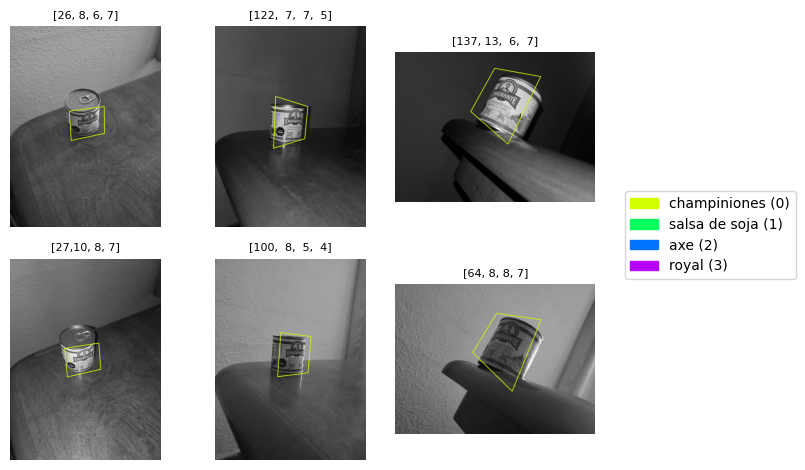

In [112]:
champiniones = (
    read_img(path(dir_mis_productos_recon, "champiniones", f"champiniones-{i}.jpeg"))
    for i in range(1, 7)
)

fig, ax = plt.subplots(2, 3)
rec.show_predictions(champiniones, fig, ax)

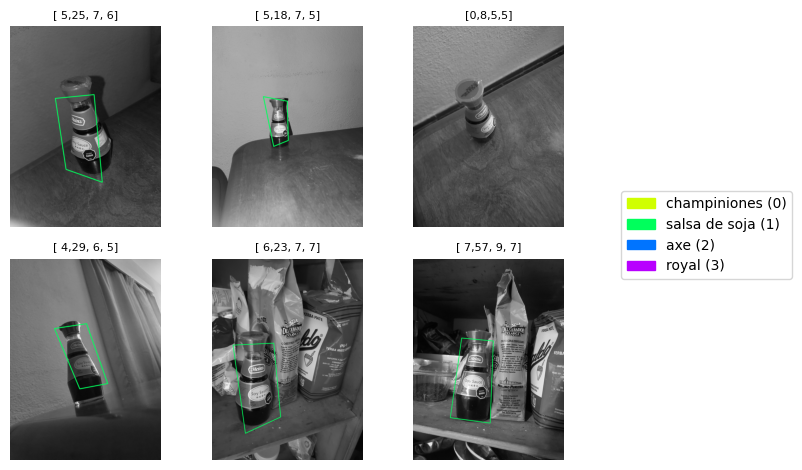

In [113]:
soja = (
    read_img(path(dir_mis_productos_recon, "salsa_soja", f"sauce-{i}.jpeg"))
    for i in range(1, 7)
)

fig, ax = plt.subplots(2, 3)
rec.show_predictions(soja, fig, ax)

En la tercera imagen si bien salsa de soja recibe mas "votos", es decir se detectan mayor cantidad de inliers para este producto que para el resto de la base, los 8 detectados no son suficientes para marcarlo como detectado debido al umbral que elegimos (threshold_inliers=15).

De todas formas, esa era una imagen dificil de procesar. Debido a la inclinacion tan pronunciada hay un gran cantidad de caracteristicas de la etiqueta del producto que no se ven y por ende no podremos usar para el reconocimiento.


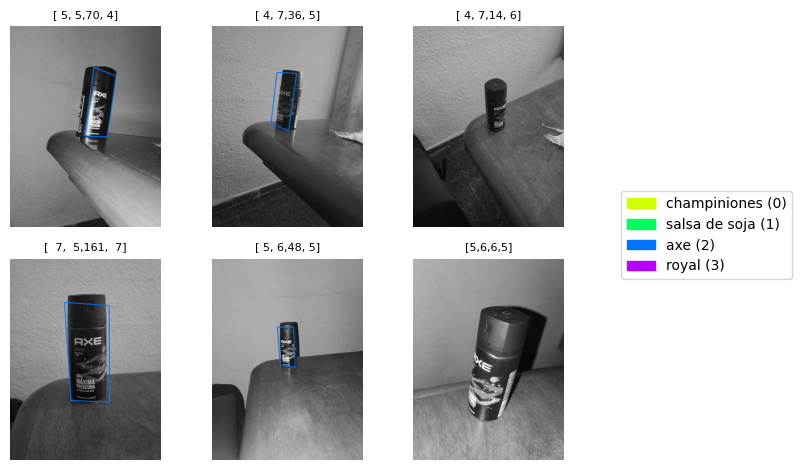

In [114]:
axe = (
    read_img(path(dir_mis_productos_recon, "axe", f"axe-{i}.jpeg")) for i in range(1, 7)
)

fig, ax = plt.subplots(2, 3)
rec.show_predictions(axe, fig, ax)

En este caso ocurre algo similar, se detectan siempre mayor cantidad de inliers del producto adecaudo 'axe'
pero cuando el angulo de la perspectiva es muy alto no se alcanza el threshold acordado.


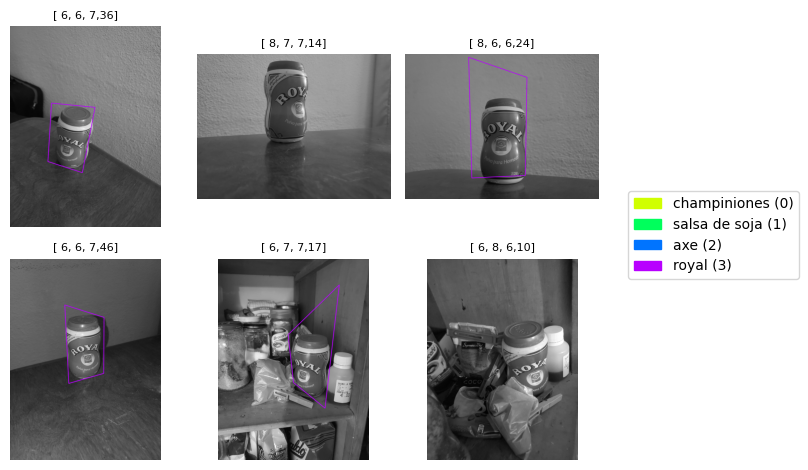

In [115]:
royal = (
    read_img(path(dir_mis_productos_recon, "royal", f"royal-{i}.jpeg"))
    for i in range(1, 7)
)

fig, ax = plt.subplots(2, 3)
rec.show_predictions(royal, fig, ax)

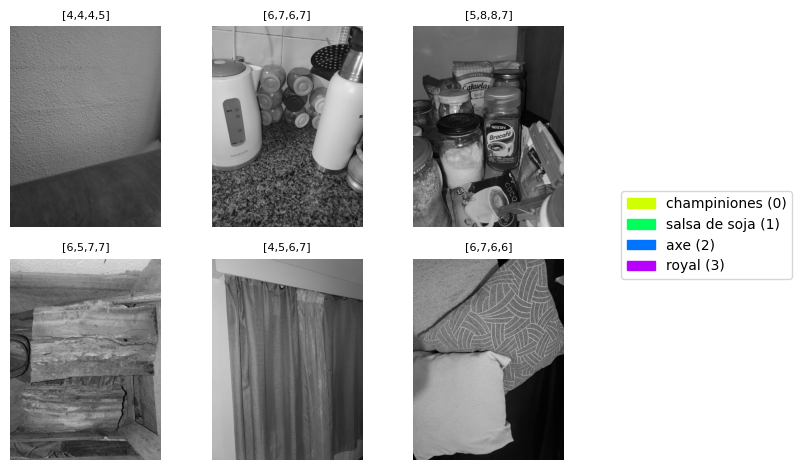

In [116]:
empty = (
    read_img(path(dir_mis_productos_recon, "empty", f"empty-{i}.jpeg"))
    for i in range(1, 7)
)

fig, ax = plt.subplots(2, 3)
rec.show_predictions(empty, fig, ax)

Es interesante observar como siempre detectamos entre 5 y 8 inliers en las imagenes aunque el producto no este presente.

En estas imagenes 'vacias' se ve claro pero en los anteriores casos tambien ocurria que encontrabamos una cantidad grande de inliers para el producto que efectivamente aparecia en la imagen y tambien encontrabamos esta cantidad residual de entre 5 y 8 para el resto.

Con un umbral de inliers de 10 hubieramos tenido mayor exito, pero estariamos actuando con un margen de error bastante pequeño, y habria mas probabilidad de falsos positivos (vease la imagen de champinones[0][2], hubiera sido un falso positivo salsa de soja).

Otra estrategia que podriamos haber utilizado para clasificar como detectado o no podria ser:

```python
if inliers_prod_mayor_confianza > threshold_inliers=10:
    productos_reconocidos = where(
        (inliers_por_producto >= maximum(inliers_por_producto) * 0.6) &
        (inliers_por_producto >= 10))
```

De esta forma no aceptamos productos con menos de 10 inliers pero ademas tampoco aceptamos productos con mas de 10 inliers que no tengan al menos un 60% de la cantidad de inliers del maximo.

Esto hubiera solucionado el caso del falso positivo y podria ser beneficioso con imagenes complejas. Aquellas con diferentes texturas y detalles que puedan ser confundidas con algun producto.
